In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os
import sys
import os
import sys

import numpy as np
import tensorflow as tf
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import skimage
import skimage.io
%matplotlib inline

print('sys_version', sys.version.replace('\n', ''))
print('virtual_env', os.environ.get('VIRTUAL_ENV', 'None'))
print('pwd', os.getcwd())
print('np ', np.__version__)
print('tf ', tf.__version__)

# fix import src problem
sys.path.append('..')
sns.set_style("whitegrid", {'axes.grid' : False})

sys_version 3.5.2 (default, Nov 17 2016, 17:05:23) [GCC 5.4.0 20160609]
virtual_env /home/marko/.virtualenvs/mozgalo
pwd /home/marko/Projects/mozgalo2017/notebooks
np  1.12.1
tf  1.1.0


# Mozgalo

## Datasets

In [2]:
from src.modules.dataset import *
from src.modules.dataset_utils import *


# print datasets and paths
for name, path in dataset_imgs_root.items():
    print('Dataset %s\n\texists?: %s\n' % (name, os.path.exists(path)))

Dataset stl10
	exists?: True

Dataset cifar10
	exists?: True

Dataset cats_dogs
	exists?: True

Dataset mozgalo
	exists?: True



## Dataset examples


Dataset: stl10, n_samples: 5000, n_classes: 10


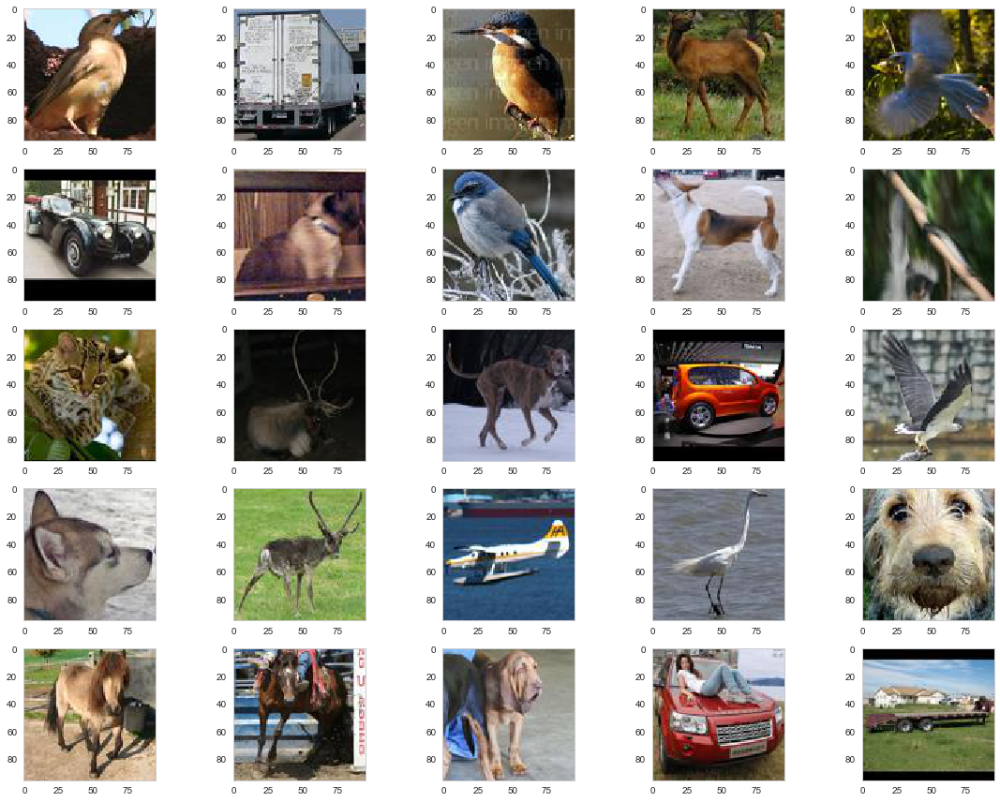


Dataset: cifar10, n_samples: 50000, n_classes: 10


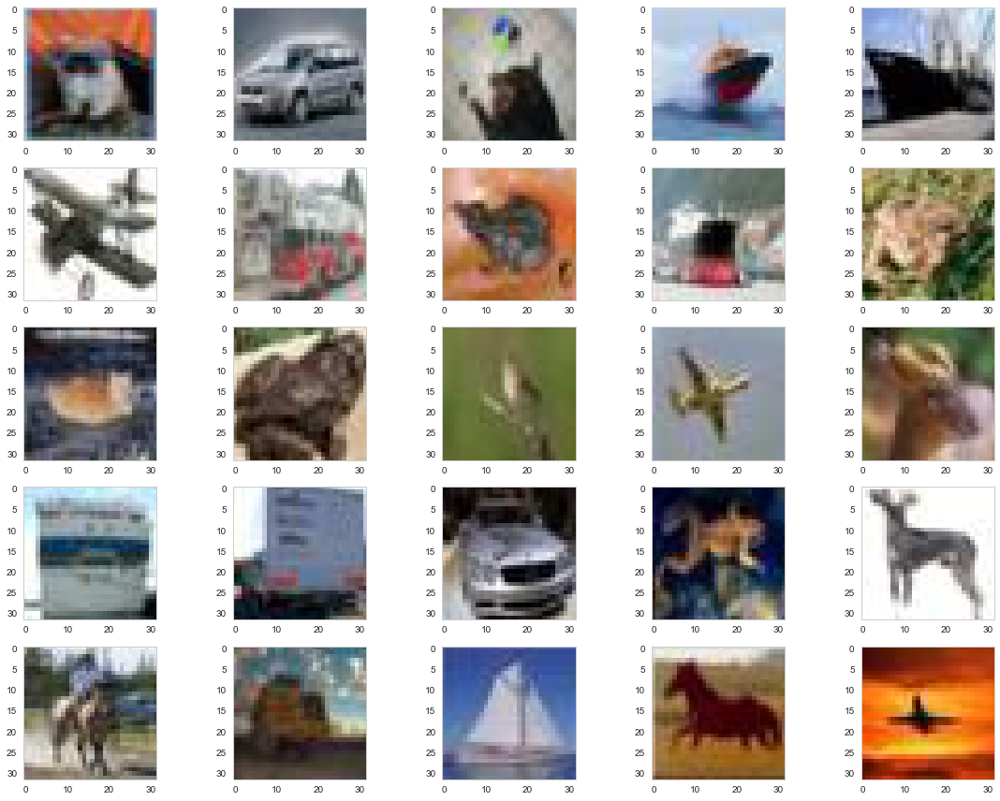


Dataset: cats_dogs, n_samples: 25000, n_classes: 2


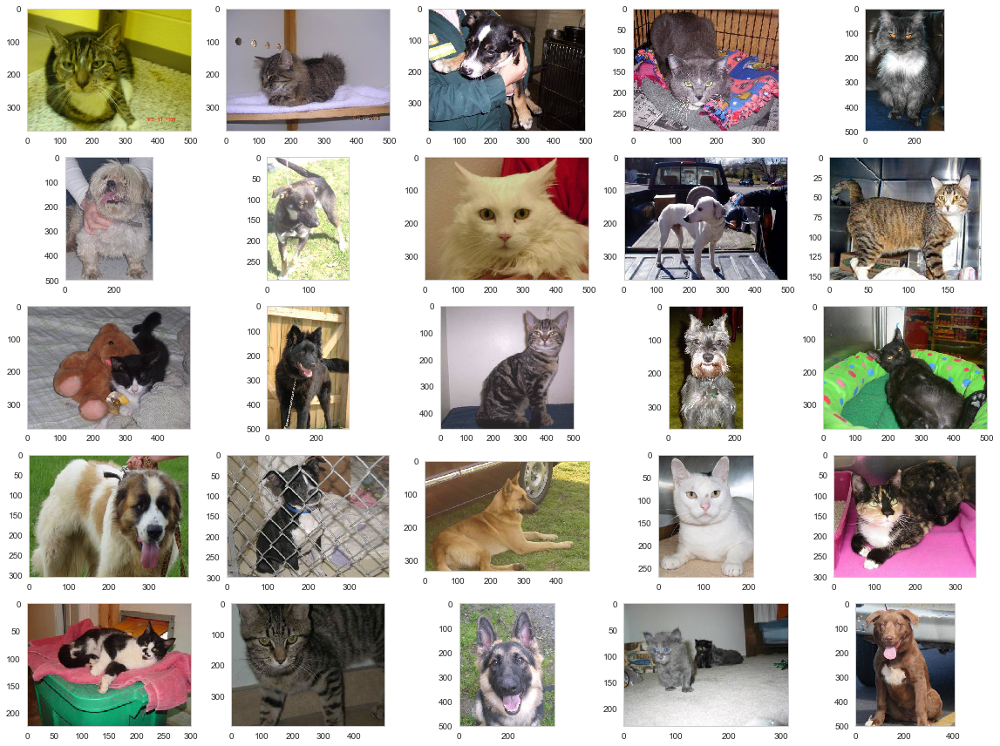


Dataset: mozgalo, n_samples: 6889, n_classes: unknown


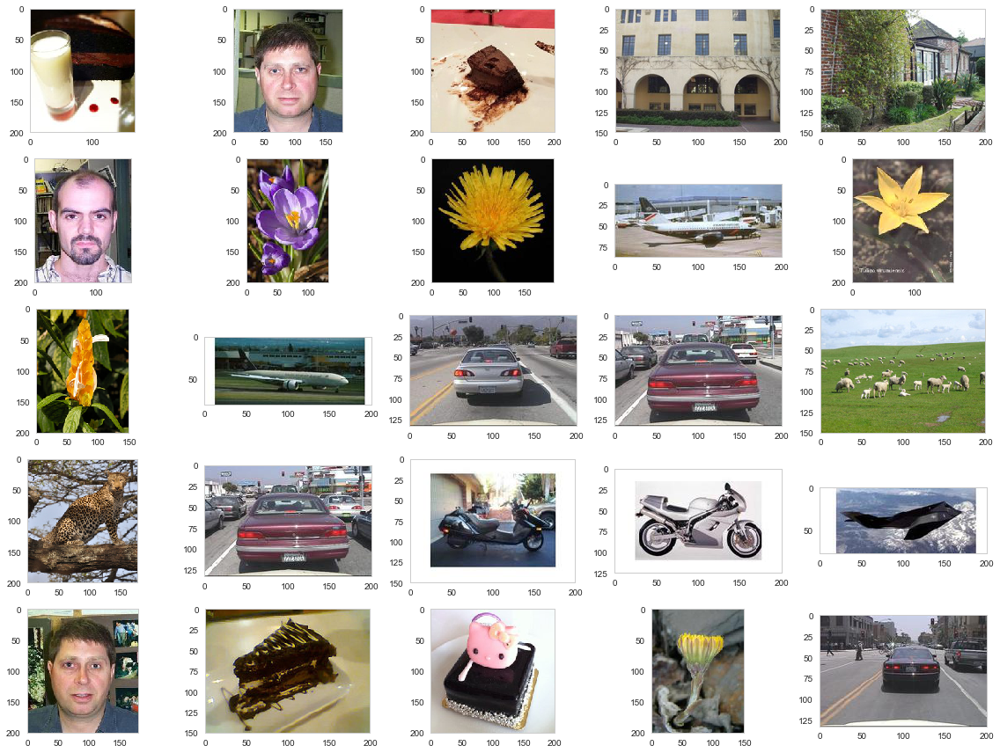

In [3]:
for name, path in dataset_imgs_root.items():
    n_samples = len(os.listdir(path))
    different_classes = get_n_different_classes(name)
    
    print()    
    print("Dataset: %s, n_samples: %s, n_classes: %s" % (name, n_samples, different_classes))
    show_random_sample(path)

## Loading dataset

In [5]:
from src.modules.feature_extractors import inceptionv3, inceptionv4, resnet50
from src.modules.utils import *
from src.modules.dataset import *

init_logging()


# Loading dataset
dataset_name = 'mozgalo'
dataset = ImageDataset(dataset_imgs_root[dataset_name])


## Feature extraction

In [6]:
# Define network used to extract features
features_extraction_model = inceptionv3.InceptionNet()
features_extraction_model.create_graph()

### Extracting features and dumping to file

- slow operation, recomended to run once and store results

### Load preextracted features from last run

In [7]:
features_path = pickled_features_path(dataset_name, features_extraction_model)

if os.path.exists(features_path):
    logging.info("Reloading cached features")
    dataset.load_features(features_path)
else:
    logging.info("Features not found, extracting")
    dataset.extract_features(features_extraction_model)
    dataset.store_features(features_path)


2017-05-19 15:02:58 INFO     Reloading cached features
2017-05-19 15:02:58 DEBUG    Loading imgs in dataset


100%|██████████| 6889/6889 [00:05<00:00, 1181.30it/s]


## Feature extraction sanity check
- for given image find most similar images in dataset

100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


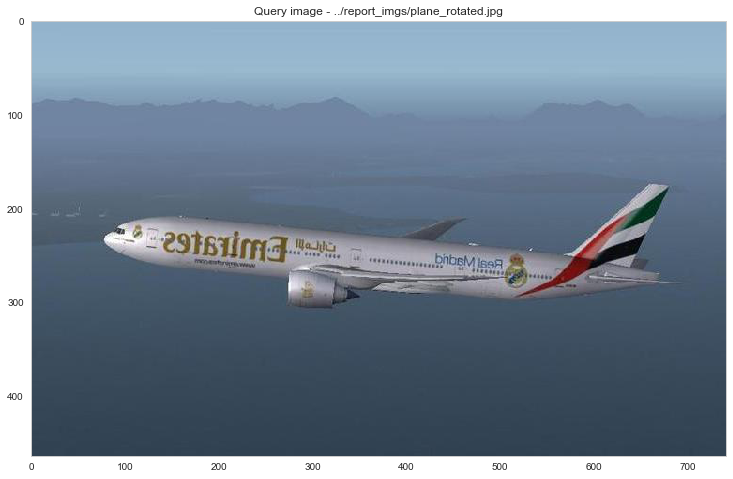

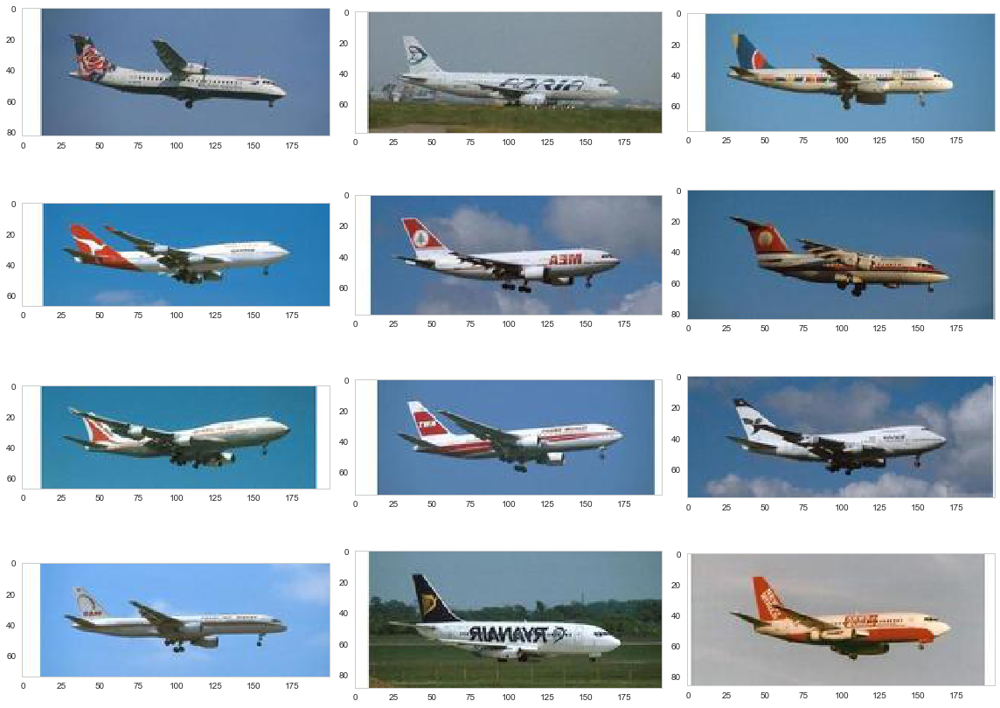

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


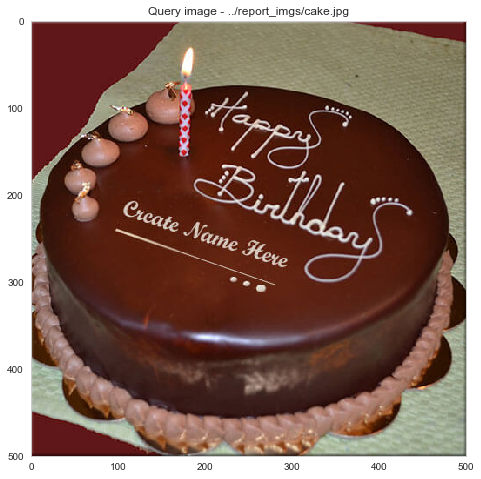

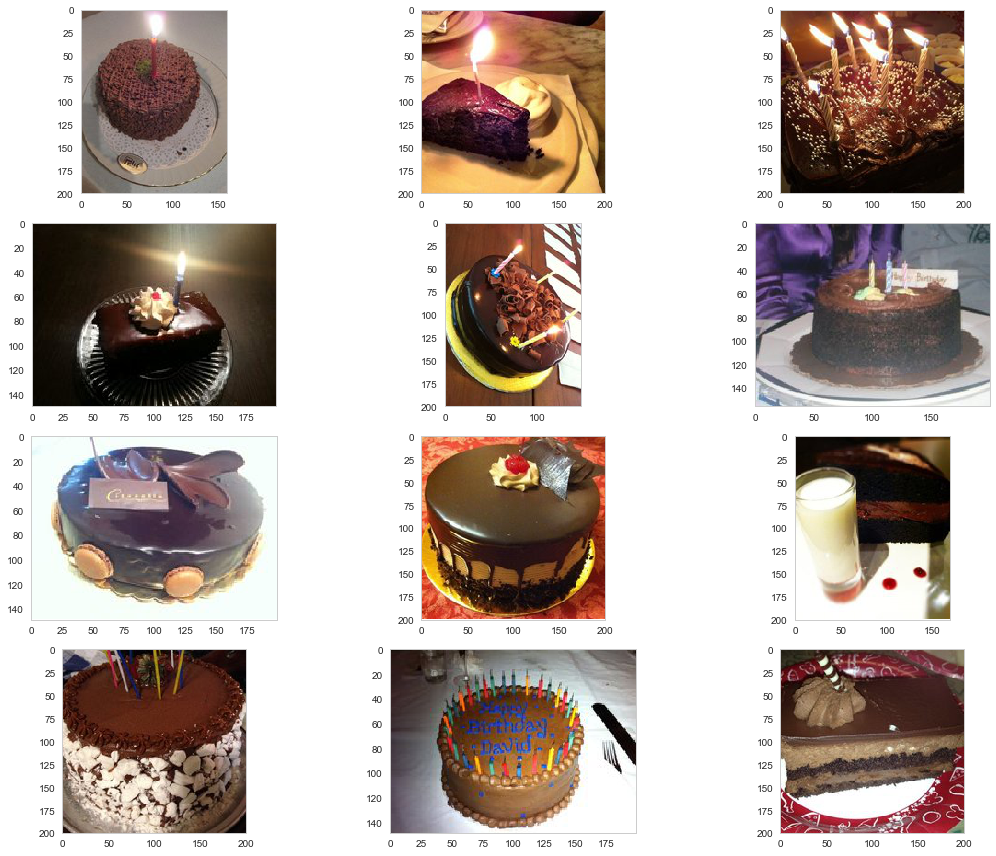

100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


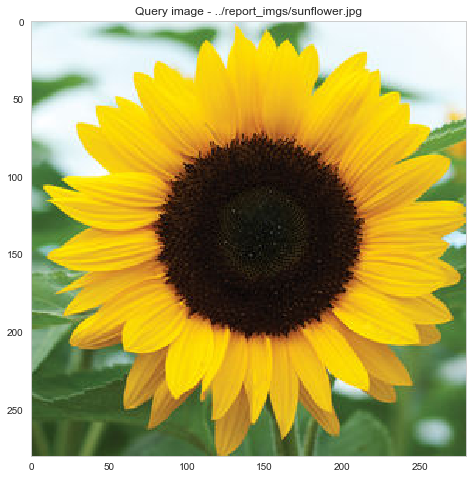

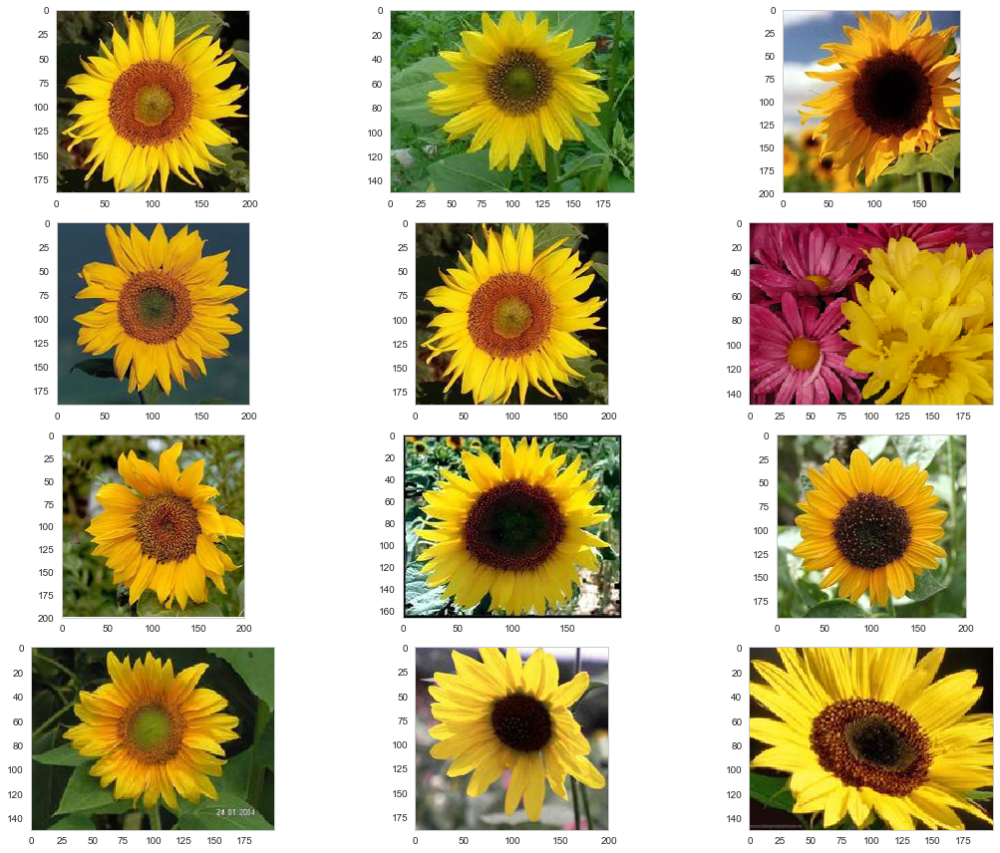

In [15]:
get_features = lambda x: features_extraction_model.extract_features([x])[0]

test_imgs = ['../report_imgs/plane_rotated.jpg', 
             '../report_imgs/cake.jpg', 
             '../report_imgs/sunflower.jpg']


for img in test_imgs:
    plot_closest_results(img, get_features, dataset)


# Clustering scores

# Clustering test

## Evaluation on labeled datasets

In [35]:
from sklearn.preprocessing import  StandardScaler
from sklearn.decomposition import PCA

In [46]:
from sklearn.cluster import KMeans

for name in datasets.keys():
    n_samples = len(os.listdir(path))
    different_classes = get_n_different_classes(name)

results = []
for name, path in dataset_imgs_root.items():
    n_samples = len(os.listdir(path))
    k = get_n_different_classes(name)

    if str(k) == 'unknown':
        # skip unlabeled datasets
        continue
        
    if name != 'stl10':
        continue
    
    logging.info("Running %s", name)
    ds = ImageDataset(dataset_imgs_root[name])
    
    # get features
    features_path = pickled_features_path(name, features_extraction_model)
    if os.path.exists(features_path):
        # restore, skip loading in case of large dataset
        ds.load_features(features_path, skip_img_load=True)
    else:
        continue
        ds.extract_features(features_extraction_model)
        ds.store_features(features_path)

    clustering = KMeans(n_clusters=k)
    x = ds.features
    clustering.fit(x)
    
    # dump results to dir
    out_dir = os.path.join(CLUSTER_OUT_ROOT, '%s_%s' % (name, features_extraction_model.name))
    ds.save_clusters_to_file(out_dir, clustering.labels_, force_reload=True)
    
    results.append(compare_cluster_to_labels(out_dir, name))

2017-05-19 12:39:01 INFO     Running stl10


100%|██████████| 10/10 [00:07<00:00,  1.28it/s]


In [47]:
results[0]

,dataset,accuracy,precision,recall,F1,ARI
0,stl10,0.9074,0.926139,0.9074,0.910356,0.799336


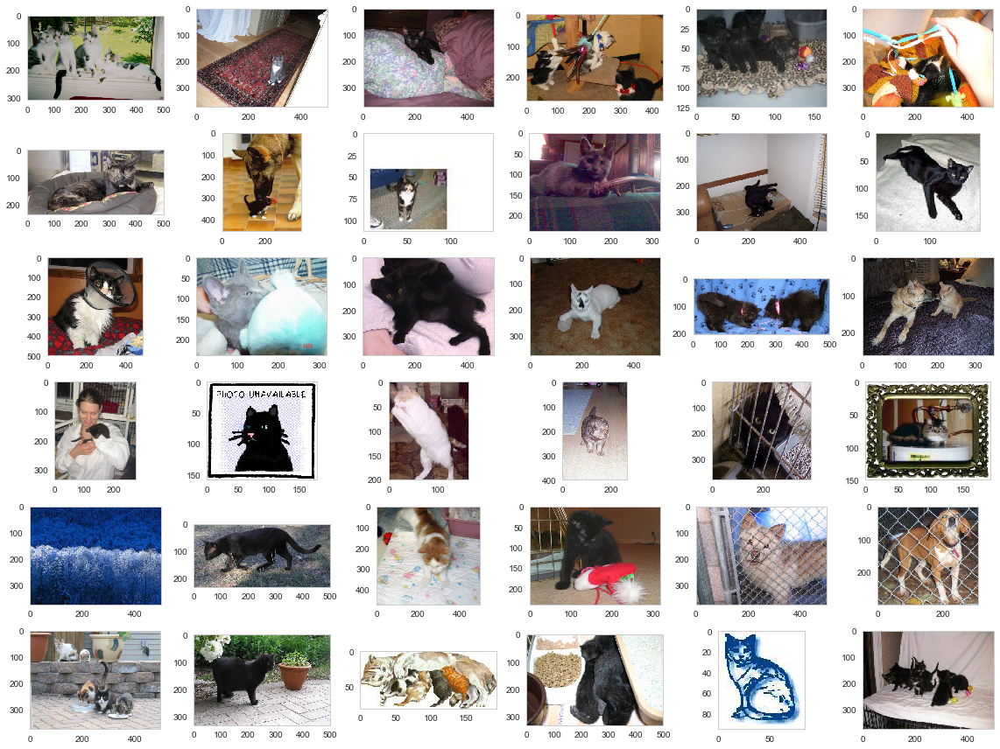

In [26]:
show_random_sample('./cats_dogs_clusters/_wrong/', 36)

In [48]:
dataset_name = 'mozgalo'
dataset = ImageDataset(dataset_imgs_root[dataset_name])

# generate the linkage matrix
with Timer("Linkage"):
    Z = linkage(dataset.features, 'ward')

plt.figure(figsize=(14, 8))
plt.xlabel('group size')
plt.ylabel('distance')
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=14,  # show only the last p merged clusters
    leaf_rotation=90.,
    leaf_font_size=25.,
    show_contracted=True,    
)

plt.show()

2017-05-19 14:43:17 INFO     Duration Linkage 36 s


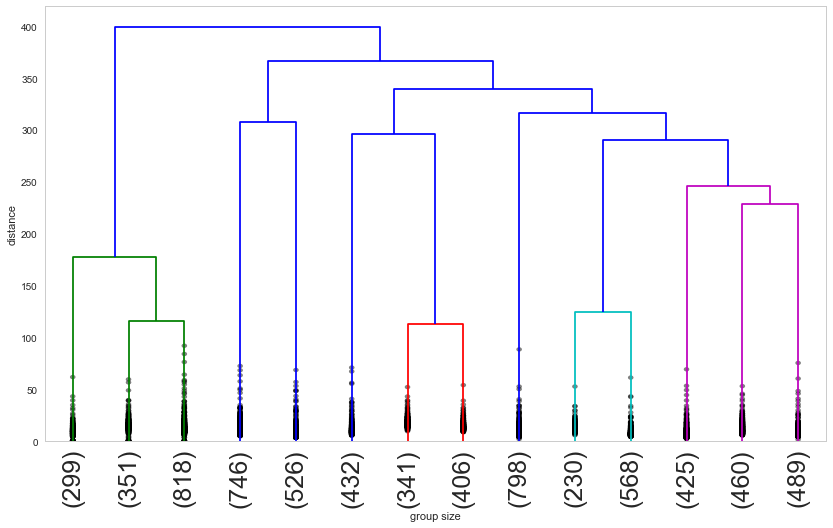

In [96]:
np.array(dataset.features).shape

(0,)

In [ ]:
from sklearn.cluster import AgglomerativeClustering

for k in tqdm(range(5, 15)):
    model = AgglomerativeClustering(k)
    model = model.fit(dataset.features)

    # dump results to dir
    out_dir = os.path.join(CLUSTER_OUT_ROOT, 'hac', 'hac_%s' % k)
    dataset.save_clusters_to_file(out_dir, model.labels_)

In [ ]:
#print klasters by size
root_dir = '../clusters/hac/'

for d in sorted(os.listdir(root_dir)):
    path = os.path.join(root_dir, d)
    clusters = os.listdir(path)
    
    print(d, len(clusters))
    for sub_d in os.listdir(path):
        sub_path = os.path.join(path, sub_d)
        print('\t', sub_d, len(os.listdir(sub_path)))

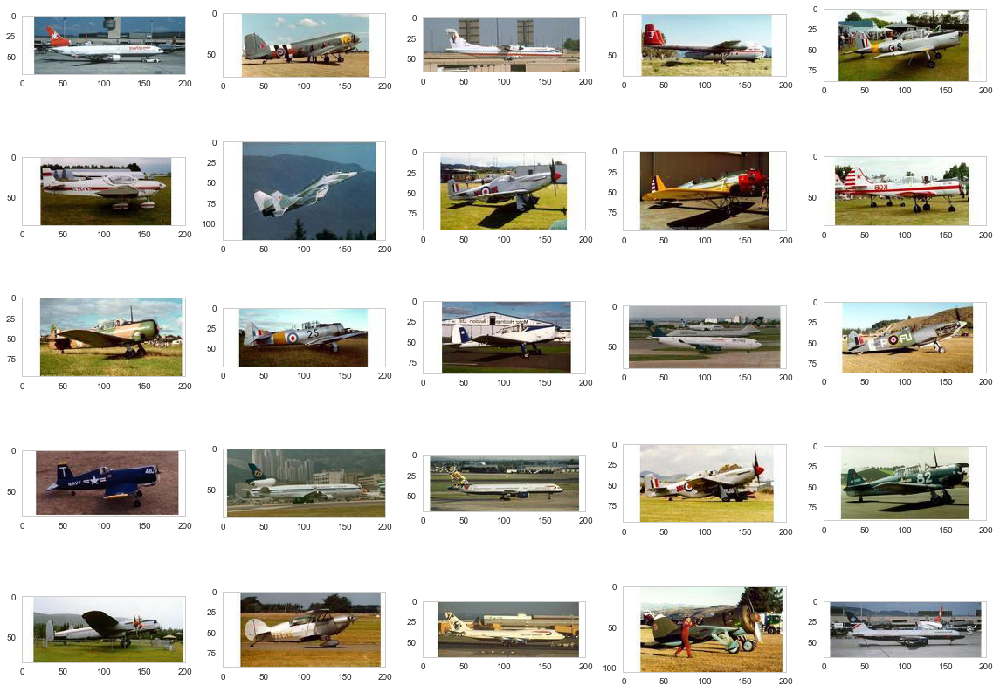

In [19]:
show_random_sample('../clusters/hac/hac_13/11/')
    

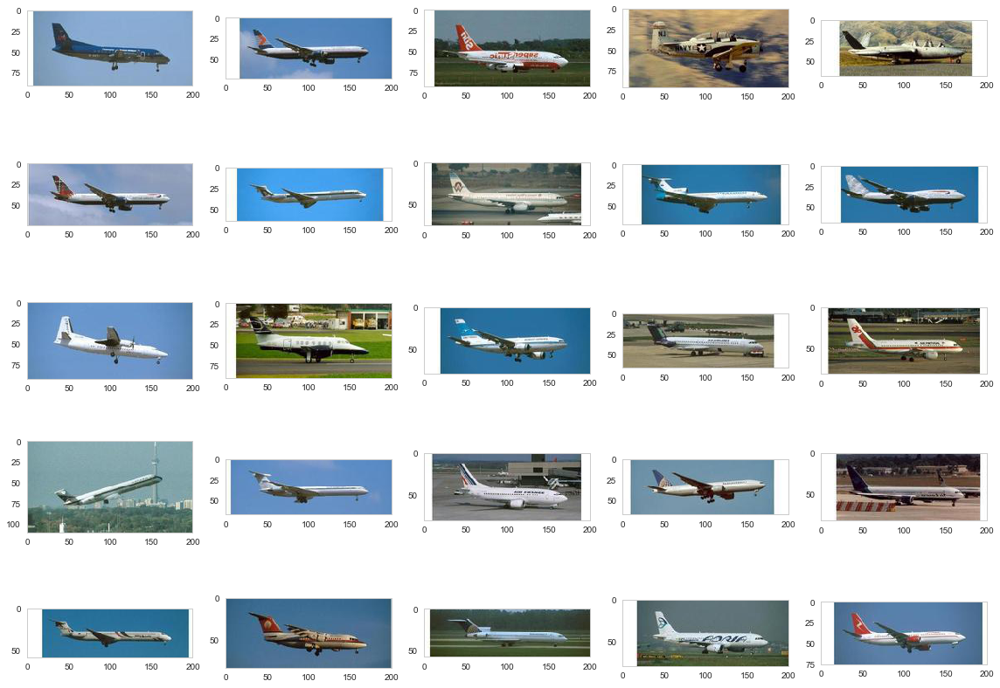

In [17]:
show_random_sample('../clusters/hac/hac_13/7/')
    